# Graphs and Text analysis for the South Park Wiki Fandoms!

**Dataset: South Park Wiki Archives:**

- South Park Archives: https://southpark.fandom.com/wiki/South_Park_Archives 

- South Park Archives: Stick of Truth: https://southpark.fandom.com/wiki/South_Park:_The_Stick_of_Truth 
### Description
This part of the Notebook is meant to display all the graph visualizations and text analysis of the South Park (SP) Wiki Archives. The data was mined from the above mentioned South Park Wiki Archives and processed in part A . Most of the things imported which were processed in part A are: 
- df_final_SouthPark_characters.csv for the DataFrame containing the characters and their attributes
- graph.gefx: graph containing all the SP characters
- graph_game.gefx: graph containing the SP characters from the 'Stick of Truth' game
- Characters_txt_files: processex TXT files of ech SP character

Bellow are the main key-points which will be presented: 

#### 1) Networks and Visualization!
##### 1.1) **South Park Network - whole Series**

**Nodes**: SP characters
**Node Attributes**:
 - real name: character name as it appears on the Wiki page
 - game role: Playable Characters, Enemies, Land of Zaron, Merchants or Not in the Game
 - series role: characters' role in the series (main character, major-supportive character, other (if not specified))
 - gender: Male, Female or Unknown
 - race
 - episode appearance

**Edges**: each character will be linked to the other characters based on their interractions given by the Wiki pages

##### 1.2) **South Park 'Stick of Truth' Network**

**Nodes**: SP characters
**Node Attributes**:
 - real name: character name as it appears on the Wiki page
 - game role: Playable Characters, Enemies, Land of Zaron, Merchants or Not in the Game
 - gender: Male, Female or Unknown
 - race

**Edges**: each character will be linked to the other characters based on their interractions given by the Wiki pages

#### 3) Word-Cloud for each gender

Word-clouds based on the gender distribution of the SP characters

#### 4) Communities

Communities were calculated based on the Louvain method. Word-clouds were displayed for the top 5 communities

#### 5) Word-clouds for the main male and female character

Two wordclouds were generated for both Eric Cartman and Wendy Tastaburger

#### 6) Sentiment Analsysis

Sentiment Analysis will be done using the characters' text files. 

## Pre-requisites

### Packages:

In [ ]:
# Pre-requisites to run this notebook: install the packages
'''
!pip install numpy
!pip install pandas
!pip install networkx
!pip install fa2
!pip install plotly==5.4.0
!pip install python-louvain
!pip install nltk
'''


'\n!pip install numpy\n!pip install pandas\n!pip install networkx\n!pip install fa2\n!pip install plotly==5.4.0\n!pip install python-louvain\n!pip install nltk\n'

In [ ]:
# Test for package requirements
import numpy as np
import networkx as nx
import plotly
import community.community_louvain
import nltk
import fa2
import urllib
import pandas as pd
import seaborn as sns
import matplotlib
import re
import requests
import json
import operator
import matplotlib as mpl
import collections
import plotly.graph_objects as go
import os.path
import matplotlib.image as mpimg
import urllib

from requests import get
from fa2 import ForceAtlas2
from collections import Counter
from matplotlib import pyplot as plt
from tqdm import tqdm
from PIL import Image
from nltk.corpus import stopwords
from wordcloud import WordCloud
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer 
from urllib.parse import quote
from wordcloud import ImageColorGenerator
from sklearn.feature_extraction.text import TfidfVectorizer
    

In [ ]:
# setting up a random seed
import random
random.seed(10)
import random
import numpy as np
seed = 123
random.seed(seed)
np.random.seed(seed)

### Importing the DataFrame object
- compiled in Part A: Data Mining

In [ ]:
df_final = pd.read_csv('df_final_SouthPark_characters.csv')

# 1) Networks and Visualization!

## 1.1) South Park Network - whole Series

#### Importing the graph
- created in Part A: Data Mining

In [ ]:
G_export = nx.read_gexf("graph.gexf")

### Extract the largest connected component

In [ ]:
# 2. Largest component (GCC):
sorted_weakly_connect_comp = sorted(nx.weakly_connected_components(G_export), key=len, reverse=True)
# The 1st element of 'sorted_weakly_connect_comp' is the largest component
GCC = G_export.copy()

# Remove weakly connected nodes
for i in range(1, len(sorted_weakly_connect_comp)):
    GCC.remove_nodes_from(sorted_weakly_connect_comp[i])

GN = GCC.to_undirected()

# add missing attributes:
for node in GN.nodes():
   node_dict = GN.nodes[node]
   if node_dict.get('role') is None:
      node_dict['role']='Not in the game'

### Graph Visualization - nodes colored based on game role


Nodes are colored based on the game role attributes:
- Playable Characters: green
- Land of Zaron: lime green
- Enemies: red
- Merchants: azure blue
- Not in the Game: gray

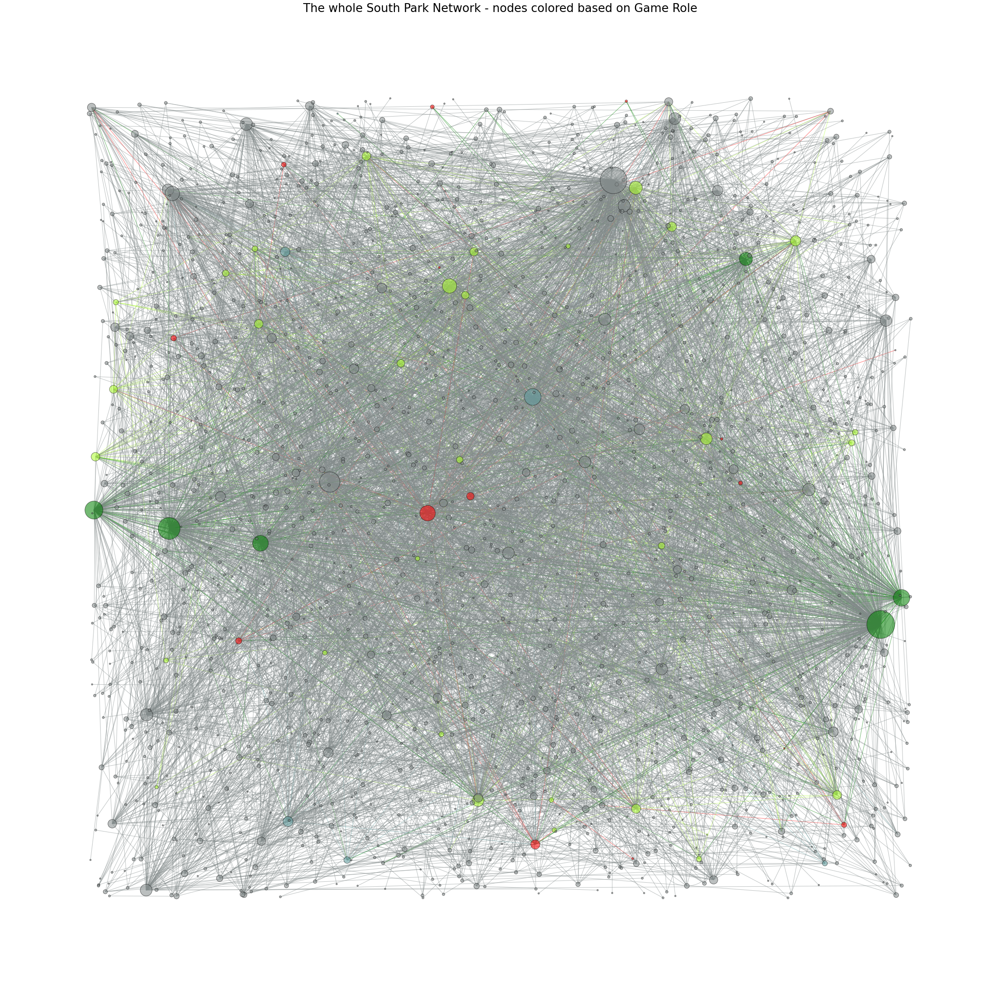

In [ ]:
color_map_game_nodes = []
for n in list(GN.nodes()):
    if GN.nodes[n]['role_game'] is not None: #some nodes are missing those attributes
        if GN.nodes[n]['role_game'] == 'Playable Characters':
            color_map_game_nodes.append("green")
        elif GN.nodes[n]['role_game'] == 'Land of Zaron':
            color_map_game_nodes.append("#ADFF2F") #lime green
        elif GN.nodes[n]['role_game'] == 'Enemies':
            color_map_game_nodes.append("red")
        elif GN.nodes[n]['role_game'] == 'Merchants':
            color_map_game_nodes.append("#5F9EA0") #light blue
        else:
            color_map_game_nodes.append("#838B8B") #gray if no role in the game
    else:
        color_map_game_nodes.append("#838B8B") #gray

color_map_game_edges = []
for edge in list(GN.edges()):
    n2 = edge[1]
    if len(GN.nodes[n2]): #some nodes are missing attributes
        if GN.nodes[n2]['role_game'] == 'Playable Characters':
            color_map_game_edges.append("green")
        elif GN.nodes[n2]['role_game'] == 'Land of Zaron':
            color_map_game_edges.append("#ADFF2F") #lime green
        elif GN.nodes[n2]['role_game'] == 'Enemies':
            color_map_game_edges.append("red")
        elif GN.nodes[n2]['role_game'] == 'Merchants':
            color_map_game_edges.append("#5F9EA0") #light blue
        else: 
            color_map_game_edges.append("#838B8B") #gray if no role in the game
    else:
        color_map_game_edges.append("#838B8B") #gray if no role in the game



d = dict(GN.degree)
matplotlib.rcParams['figure.figsize'] = [40,40]
plt.figure(1)
plt.title('The whole South Park Network - nodes colored based on Game Role', size = 26)
pos = nx.random_layout(GN)

nx.draw(GN, pos, node_size=[v * 11 for v in d.values()], node_color=color_map_game_nodes, alpha=0.55, edge_color=color_map_game_edges, edgecolors = "#000000", node_shape="o")

The graph above represents the South Park Network. The Network Analysis section will present more data regarding the graph. 

The nodes represents the SP characters and the links are the interractions they have with other characters, as stated in the Wiki Pages. The nodes are colored based on the attributes related to the role in the 'Stick of Truth' game (see the above description). If a character does not belong in the game, they are colored in gray. 

As a first glance, the graph seems very complez and not a lot of nodes are colored (hence not many SP characters are in the game). Bellow Force Atlas visualization is used for having a more hollistic overview. 

#### Force Atlas visualization

100%|██████████| 200/200 [00:02<00:00, 94.84it/s]
BarnesHut Approximation  took  1.75  seconds
Repulsion forces  took  0.02  seconds
Gravitational forces  took  0.00  seconds
Attraction forces  took  0.07  seconds
AdjustSpeedAndApplyForces step  took  0.10  seconds


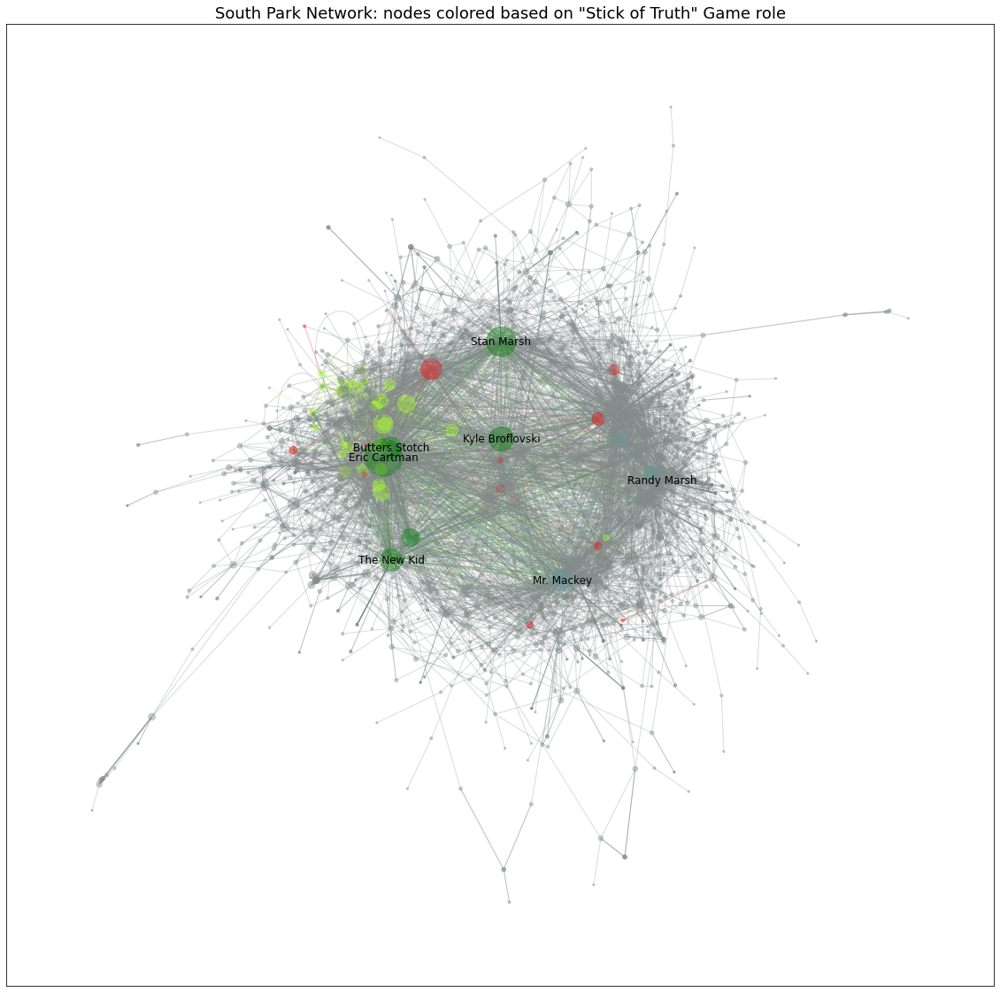

In [ ]:
forceatlas2 = ForceAtlas2(
                            outboundAttractionDistribution=False,
                            edgeWeightInfluence=1.5,
                            jitterTolerance=0.1,

                            barnesHutOptimize=True,
                            barnesHutTheta=10,

                            scalingRatio=1.,
                            strongGravityMode=True,
                            gravity=0.4,
                            verbose=True)

positions = forceatlas2.forceatlas2_networkx_layout(GN,pos=None,iterations=200)

sorted_nodes_by_degree_1 = sorted(GN.degree, key=lambda x: x[1], reverse=True)
sorted_nodes_by_degree = list(list(zip(*sorted_nodes_by_degree_1))[0])
sorted_nodes_by_degree.pop(1)

plt.figure(figsize=(20, 20))
nx.draw_networkx_nodes(GN,positions,
                       node_color=color_map_game_nodes,
                       node_size=[v*5 for v in dict(GN.degree()).values()], 
                       alpha = 0.4)

nx.draw_networkx_labels(GN, positions, 
                        labels={name: GN.nodes[name]['real_name'] for name in GN.nodes() if (name in sorted_nodes_by_degree[:7])})

nx.draw_networkx_edges(GN, positions, edge_color=color_map_game_edges, alpha=0.3)

plt.title('South Park Network: nodes colored based on "Stick of Truth" Game role', size = 18)
plt.savefig('./plot_images/SPGraph_gamecolor.png')
plt.draw() 

Above is the SP Nework using the Force Atlas representation. The node size is proportional to the degree of the node. The names of the characters are displayed for the most connected nodes. From this figure it can be observed that the characters which are present in the 'Stick of Truth' game are also the main characters of the SP Series, as they have a lot of links connected to them. This is an interesting point of view, as without watching the SP series and only by doing some network analysis, one can already notice who the main characters are. 

One exception is the New Kid: although he is the main playable character in the game, he does not appear in the series. 

### Graph Visualization - nodes colored based on gender


Nodes are colored based on the gender:
- Male: blue
- Female: pink
- Unknown: yellow

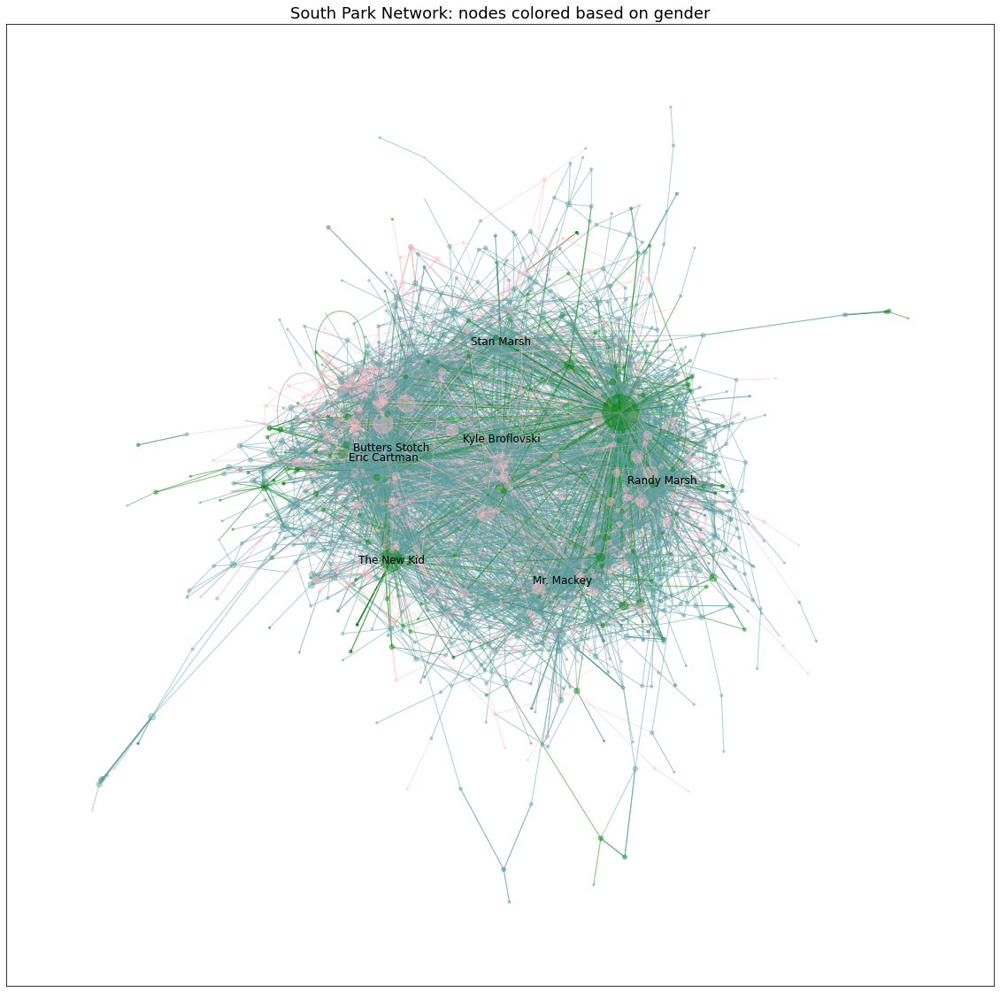

In [ ]:


color_map_gender_nodes = []
for n in list(GN.nodes()):
    if GN.nodes[n]['role'] is not None: #some nodes are missing those attributes
        if GN.nodes[n]['gender'] == 'Female':
            color_map_gender_nodes.append("pink")
        elif GN.nodes[n]['gender'] == 'Male':
            color_map_gender_nodes.append("#5F9EA0")
        elif GN.nodes[n]['gender'] == 'Unknown':
            color_map_gender_nodes.append("green")
        else:
            color_map_gender_nodes.append("gray")
    else:
        color_map_gender_nodes.append("gray")

color_map_gender_edges = []
for edge in list(GN.edges()):
    n2 = edge[1]
    if len(GN.nodes[n2]): #some nodes are missing attributes
        if GN.nodes[n2]['gender'] == 'Female':
            color_map_gender_edges.append("pink")
        elif GN.nodes[n2]['gender'] == 'Male':
            color_map_gender_edges.append("#5F9EA0")
        elif GN.nodes[n2]['gender'] == 'Unknown':
            color_map_gender_edges.append("green")
        else: 
            color_map_gender_edges.append("gray")
    else:
        color_map_gender_edges.append("gray")

plt.figure(figsize=(20, 20))
nx.draw_networkx_nodes(GN,positions,
                       node_color=color_map_gender_nodes,
                       node_size=[v*5 for v in dict(GN.degree()).values()], 
                       alpha = 0.4)

nx.draw_networkx_labels(GN, positions, 
                        labels={name: GN.nodes[name]['real_name'] for name in GN.nodes() if (name in sorted_nodes_by_degree[:7])})

nx.draw_networkx_edges(GN, positions, edge_color=color_map_gender_edges, alpha=0.5)

plt.title('South Park Network: nodes colored based on gender', size = 18)
plt.savefig('./plot_images/SPGraph_gendercolor.png')
plt.draw() 



Above is the SP Network where nodes are colored based on gender. One can see purely based on the graph that South Park consists of predominantly male characters. This is also confirmed by the DataFrame analysis in Part_A_Data_Mining.ipynb. 

As for the other attributes, such as race and series role, there are too many cateogires of them (see Part_A_Data_Mining.ipynb) and coloring the graph nodes based on these attributes rather leads to a messy graph. 

Next follows a more in-depth network analysis in order to discover more patterns related to the SP network. 

### South Park Network Analysis

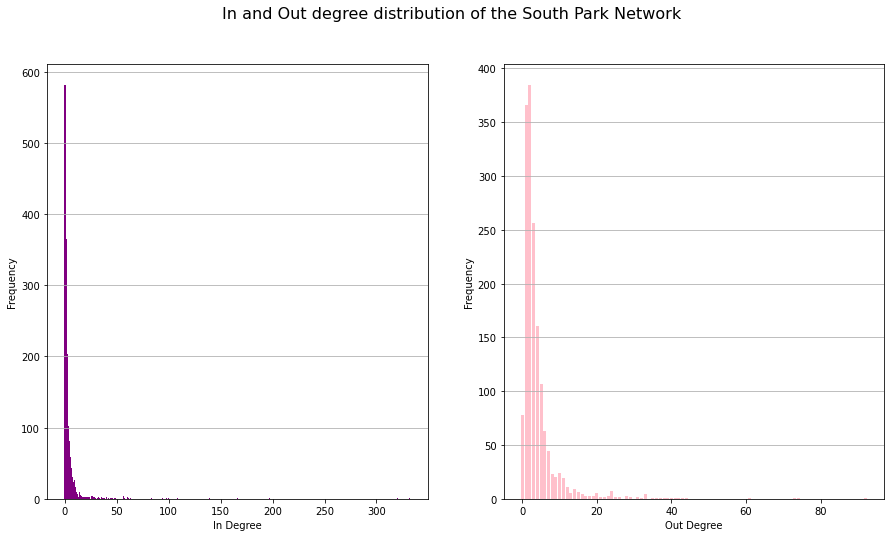

In [ ]:
gcc_in_degs = [deg for _, deg in GCC.in_degree()]
gcc_out_degs = [deg for _, deg in GCC.out_degree()]

plt.figure(figsize=(15,8))
title = 'In and Out degree distribution of the South Park Network'
plt.subplot(1,2,1)
plt.suptitle(title, size=16)
vector = list(range(np.min(gcc_in_degs), np.max(gcc_in_degs) + 2))
graph_values, graph_bins = np.histogram(gcc_in_degs, bins=vector)
plt.bar(graph_bins[:-1], graph_values, width=1.1, color = 'purple')

plt.xlabel('In Degree')
plt.ylabel('Frequency')
plt.grid(axis = 'y')
#plt.figtext(0.5, -0.1, caption, wrap=True, horizontalalignment='center', fontsize=12)

plt.subplot(1,2,2)
vector = list(range(np.min(gcc_out_degs), np.max(gcc_out_degs) + 2))
graph_values, graph_bins = np.histogram(gcc_out_degs, bins=vector)
plt.bar(graph_bins[:-1], graph_values, width=.8, color = 'pink')
plt.xlabel('Out Degree')
plt.ylabel('Frequency')
plt.grid(axis = 'y')
plt.savefig('./plot_images/in_out_degree_distr.png')
plt.show()

Above are plotted the in- and out- degree distributions. It seems that both the in- and the out- degree histograms follow a power-law distribution. This means that the SP Network might actually be a scale-free network, which explains the presence of hubs in the network plot. 

In [ ]:
print("Number of nodes in the graph: " + str(len(GN.nodes)))
print("Number of edges in the graph: " + str(len(GN.edges)))

Number of nodes in the graph: 1639
Number of edges in the graph: 5736


This means that SP is quite a big network. However, since it is a scale-free network, the degrees are not distributed uniformly but according to the power-law. This means that some nodes (most likely the main SP characters) have exponentially more links than others.


Node Kelly ("Rainforest Schmainforest") has the minimum the degree value of 1
Node Eric Cartman has the maximum the degree value of 358


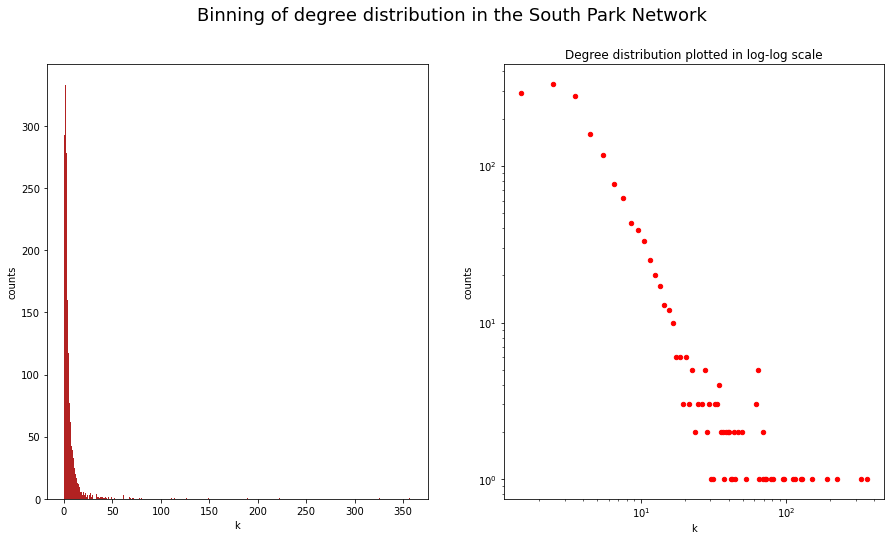

In [ ]:
degrees = dict(GN.degree)
min_degree = min(degrees.values())
max_degree = max(degrees.values())
min_degree_node = min(degrees, key=degrees.get).replace('_',' ')
max_degree_node = max(degrees, key=degrees.get).replace('_',' ')

print('Node {} has the minimum the degree value of {}'.format(min_degree_node,min_degree))
print('Node {} has the maximum the degree value of {}'.format(max_degree_node,max_degree))

# Bining Dedgree Distributions

degrees_l = list(degrees.values())
bin_range = range(min(degrees_l), max(degrees_l)+1)
freqs, edges  = np.histogram(degrees_l, bins=bin_range)
n = freqs.size
plt.figure(figsize=(15,8))
plt.subplot(121)
plt.bar(edges[:-1],freqs,width=0.9, color = 'firebrick')
plt.xlabel("k")
plt.ylabel("counts")
plt.suptitle('Binning of degree distribution in the South Park Network', size = 18)

plt.subplot(122)
mean_list = []
for i in range(n):
    mean = (edges[i] + edges[i+1]) / 2
    mean_list.append(mean)

plt.loglog(mean_list, freqs, 'ro', markersize=4.4)
plt.xlabel("k")
plt.ylabel("counts")
plt.title("Degree distribution plotted in log-log scale")
plt.savefig('./plot_images/degree_bining.png')
plt.show()

Above one can see the degree distribution bining in linear scale (left) and in log-log scale (right). The degree bining follows a power-law distribtuion, so the SP network is a scale-free network. This means that the network follows the preferrential attachment law: newly emerged nodes are more likely to connect to the nodes with higher degree (also called as ‘the-rich-get-richer’ phenoenon). It seems that Eric Cartman is actually the character with the maximum degree! This is expected, as he is one of the main characters and he also appears in the first episode of South Park. The node with the minimum degree is Kelly. 

## 1.2) Stick of Truth Network!
- based on the SP game: 'Stick of Truth'

It will be interesting to see if the same network properties are preserved in the smaller SP network extracted from the characters of the Stick of Truth game. 

##### Importing the Network:
- compiled in Part A


In [ ]:
GN_game = nx.read_gexf("graph_game.gexf")

##### Special drawing with main character images:
- retrieve image from the WIKI API - save in Characters_images folder
- add the image as a node attribute for the Game Network (GN_game)

In [ ]:
# get the image from the wiki page
def get_wiki_image(title):

    title = quote(title).replace(' ','_')
    
    try:
        title_new = "titles=" + title
        baseurl = "https://southpark.fandom.com/api.php?"
        content = "prop=pageimages&piprop=original"
        action = "action=query"
        dataformat = "format=json"
        query = "%s%s&%s&%s&%s" % (baseurl,action,title_new,content,dataformat)
        response  = requests.get(query)
        json_data = json.loads(response.text)
        img_link = list(json_data['query']['pages'].values())[0]['original']['source']
        img__link_proper = re.findall(r'(^.*)?\/revision',img_link)
        return img__link_proper[0]   
    except:
        return 0

In [ ]:
# save it in the Characters_images folder
# only need to do it once so this code is commented out
main_characters = ['Stan_Marsh', 'Kyle_Broflovski', 'Eric_Cartman', 'Kenny_McCormick', 'Wendy_Testaburger','The_New_Kid']

for name in df_final['Name']:
    
    row = df_final.loc[df_final['Name'] == name]
    role = row.iloc[0,1]
    if role == 'Playable Characters' or name in main_characters:
        img_link = get_wiki_image(name)
        if img_link != 0:
            img_name = "Characters_images/" + name.replace(' ', '_') + '.png' 
            resource = urllib.request.urlretrieve(img_link, img_name)


In [ ]:
# function to upload an image from the Characters_images folder:
def upload_image(name):

    name_image = './Characters_images/' + name + '.png'
    #import image if there
    while not os.path.isfile(name_image):
    #ignore if no such file is present.
        pass
    img1 = mpimg.imread(name_image)
    
    return img1

In [ ]:
# add images as attributes to the graph nodes
for n in list(GN_game.nodes()):
    if n in main_characters:
        GN_game.nodes[n]['image'] = upload_image(n)

### Visualization 1): using main characters' images:

Nodes are colored based on the game role attributes:
- Playable Characters: green
- Land of Zaron: lime green
- Enemies: red
- Merchants: azure blue
- Other: gray

In [ ]:
# Color Maps according to Game Role
color_map_game_nodes = []
for n in list(GN_game.nodes()):
    if 'role' in  GN_game.nodes[n]: #some nodes are missing those attributes
        if GN_game.nodes[n]['role'] == 'Playable Characters':
            color_map_game_nodes.append("green")
        elif GN_game.nodes[n]['role'] == 'Land of Zaron':
            color_map_game_nodes.append("#ADFF2F") #lime green
        elif GN_game.nodes[n]['role'] == 'Enemies':
            color_map_game_nodes.append("red")
        elif GN_game.nodes[n]['role'] == 'Merchants':
            color_map_game_nodes.append("#5F9EA0") #light blue
        else:
            color_map_game_nodes.append("#838B8B") #gray if no role in the game
    else:
        color_map_game_nodes.append("#838B8B") #gray

color_map_game_edges = []
for edge in list(GN_game.edges()):
    n2 = edge[1]
    if 'role' in GN_game.nodes[n2]: #some nodes are missing game attributes
        if GN_game.nodes[n2]['role'] == 'Playable Characters':
            color_map_game_edges.append("green")
        elif GN_game.nodes[n2]['role'] == 'Land of Zaron':
            color_map_game_edges.append("#ADFF2F") #lime green
        elif GN_game.nodes[n2]['role'] == 'Enemies':
            color_map_game_edges.append("red")
        elif GN_game.nodes[n2]['role'] == 'Merchants':
            color_map_game_edges.append("#5F9EA0") #light blue
        else: 
            color_map_game_edges.append("#838B8B") #gray if no role in the game
    else:
        color_map_game_edges.append("#838B8B") #gray if no role in the game

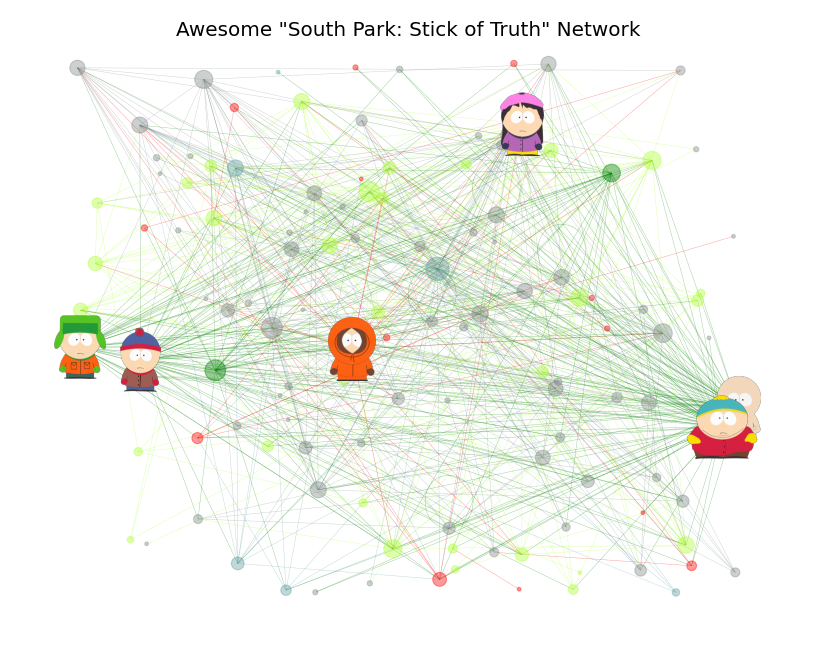

In [ ]:
#VISUALIZATION

d = dict(GN_game.degree)
options = {
    'node_color':color_map_game_nodes,
    'edge_color':color_map_game_edges,
    'node_size': [v * 11 for v in d.values()],
    'width': 0.4,
    'alpha':0.4
}

plt.figure(figsize=(10, 8), dpi=80)
nx.draw(GN_game, pos, **options) 
ax = plt.gca()
fig = plt.gcf()
trans = ax.transData.transform
trans2 = fig.transFigure.inverted().transform
imsize = 0.1

# on top of the special characters nodes add the images
for n in GN_game.nodes():
    if n in main_characters:
        (x,y) = pos[n]
        xx,yy = trans((x, y))
        xa,ya = trans2((xx, yy))
        a = plt.axes([xa-imsize/2.0, ya-imsize/2.0, imsize, imsize])
        img = GN_game.nodes[n]['image']
        a.imshow(img)
        a.set_aspect('equal')
        a.axis('off')
plt.suptitle('Awesome "South Park: Stick of Truth" Network', size = 18)
plt.draw()
plt.savefig('./plot_images/SPGameGraph.png')
plt.show()


Below is the SP 'Stick of Truth' Network. The nodes are the SP characters which appear in the Stick of Truth Game and the links are their interractions according to the extracted data from the wiki pages. The nodes are colored based on their role in the game, as stated above. For a nicer visualization, characters images are displayed as nodes for the main game characters: Eric Cartman, The New Kid, Stan Marsh, Wendy Testaburger (we had to show one female at least!), Kenny and Kyle. 

In [ ]:
print('Total nodes in the Stick of Truth Network: ',len(GN_game.nodes()))
print('Total edges in the Stick of Truth Network: ',len(GN_game.edges()))

Total nodes in the Stick of Truth Network:  126
Total edges in the Stick of Truth Network:  708


That means only 7.7% of the SP series characters are in the 'Stick of Truth' game. 

### Visualization 2: Interractive visualization with Plotly

Using Plotly, one can plot the South Park Stick of Truth Game Network.

In [ ]:
G = GN_game

G_pos = nx.random_geometric_graph(G, 0.135)
for node in G.nodes():
    G.nodes[node]['pos'] = G_pos.nodes[node]['pos']


In [ ]:
edge_x = []
edge_y = []
for edge in G.edges():
    x0, y0 = G.nodes[edge[0]]['pos']
    x1, y1 = G.nodes[edge[1]]['pos']
    edge_x.append(x0)
    edge_x.append(x1)
    edge_x.append(None)
    edge_y.append(y0)
    edge_y.append(y1)
    edge_y.append(None)

edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.5, color='#888'),
    hoverinfo='none',
    mode='lines')

node_x = []
node_y = []
for node in G.nodes():
    x, y = G.nodes[node]['pos']
    node_x.append(x)
    node_y.append(y)

node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    hoverinfo='text',
    marker=dict(
    showscale=True,
    colorscale='YlGnBu',
    reversescale=True,
    color=[],
    size=10,
    colorbar=dict(
        thickness=15,
        title='Node Connections',
        xanchor='left',
        titleside='right'
    ),
    line_width=2))

node_adjacencies = []
node_text = []
for node, adjacencies in enumerate(G.adjacency()):
    node_adjacencies.append(len(adjacencies[1]))
    node_text.append(adjacencies[0].replace('_',' ') + ': ' + str(len(adjacencies[1])) + ' connection(s)')

node_trace.marker.color = node_adjacencies
node_trace.text = node_text

fig = go.Figure(data=[edge_trace, node_trace],
                layout=go.Layout(
                title='<br>Interactive Network of South Park: Stick of Truth',
                titlefont_size=16,
                showlegend=False,
                hovermode='closest',
                margin=dict(b=20,l=5,r=5,t=40),
                annotations=[ dict(
                text="Python code: <a href='https://plotly.com/ipython-notebooks/network-graphs/'> https://plotly.com/ipython-notebooks/network-graphs/</a>",
                showarrow=False,
                xref="paper", yref="paper",
                x=0.005, y=-0.002 ) ],
                xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
                )
fig.show()

By interractively hovering over the nodes, one can exactly see the node (SP character) name and the number of links each node has. The lighter the color a node has, the more connections it has. Happy hovering!

### Stick of Truth Network Analysis

In [ ]:
degrees = dict(GN_game.degree)
min_degree = min(degrees.values())
max_degree = max(degrees.values())
min_degree_node = min(degrees, key=degrees.get)
max_degree_node = max(degrees, key=degrees.get)

print('Node {} has the minimum the degree value of {}'.format(min_degree_node.replace('_',' '),min_degree))
print('Node {} has the maximum the degree value of {}'.format(max_degree_node.replace('_',' '),max_degree))
print('The main game character, The New Kid, has less connections:', G.degree('The_New_Kid'))

Node Kelly P. Gardner has the minimum the degree value of 1
Node Eric Cartman has the maximum the degree value of 60
The main game character, The New Kid, has less connections: 54


Interestingly enough, node Eric Cartman is still the main charcater with the most number of connections. This is quite peculiar, as the main character one plays with in the Stick of Truth game is The New Kid. One should not underestimate the power of Wizzard Cartman! In the end, he is the one who guides The New Kid throughout the whole game!

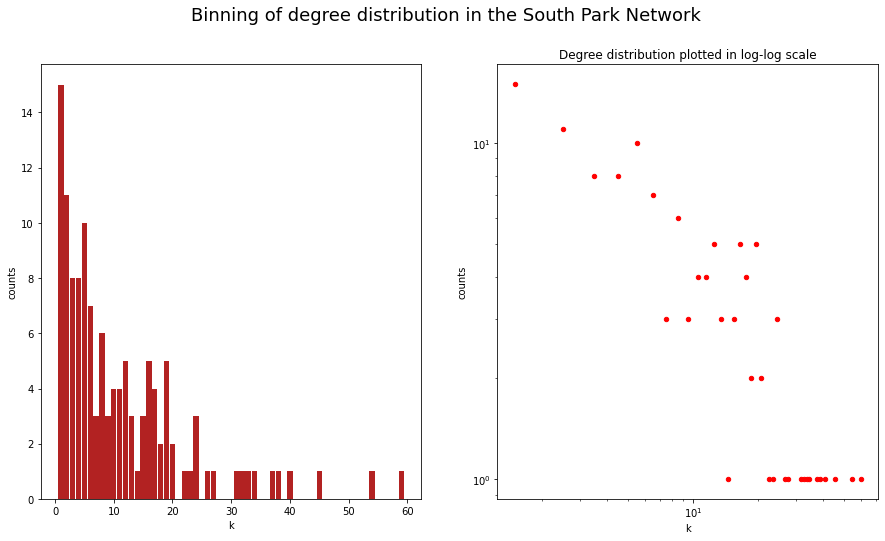

In [ ]:
# Bining Dedgree Distributions

degrees_l = list(degrees.values())
bin_range = range(min(degrees_l), max(degrees_l)+1)
freqs, edges  = np.histogram(degrees_l, bins=bin_range)
n = freqs.size
plt.figure(figsize=(15,8))
plt.subplot(121)
plt.bar(edges[:-1],freqs,width=0.9, color = 'firebrick')
plt.xlabel("k")
plt.ylabel("counts")
plt.suptitle('Binning of degree distribution in the South Park Network', size = 18)

plt.subplot(122)
mean_list = []
for i in range(n):
    mean = (edges[i] + edges[i+1]) / 2
    mean_list.append(mean)

plt.loglog(mean_list, freqs, 'ro', markersize=4.4)
plt.xlabel("k")
plt.ylabel("counts")
plt.title("Degree distribution plotted in log-log scale")
plt.savefig('./plot_images/SPGameGraph_bining_degree.png')
plt.show()

It seems that the node degrees tend to follow a power-law distribution, but the graph is too small for this to be certain. More data would be needed in order to confirm this. 

Overall, what one can notice, that although the network is smaller for the 'Stick of Truth' game, the network properties from the whole South Park Series seem to be preserved also for the small-scale Stick of Truth Network game. Cartman is still the node with the maximum degree value and the game network seems to also have the properties of a scale-free network, as for the one in the series. 



# 3) Word-Cloud for each gender

### Compile clear tokens out of the SP characters' TXT files:


In [ ]:
# we download the stopwords, punctuation and etc from nltk. which need to be filtered out from the txt files: 

nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


True

In [ ]:
df_final["Name"] = df_final["Name"].replace({'Charlie/Marcus_Andrews_and_his_Superior_Officer':'CharlieMarcus_Andrews_and_his_Superior_Officer'})
# ist of names to exclude from the clear tokens
namelist = df_final.Real_Name.str.split(" ").explode().values

**give_clean_tokens** is a function which gives the clear word tokens used for one South Park character - using its correspondent txt file. The txt file for each character was processed in Part A and contains the clean version of the correspondent SouthParkWiki page, with as little wiki-markup as possible. This function will be later applies for all the South Park characters.

In [ ]:
def give_clean_tokens(name, namelist, file_path):

    """
    give_clean_tokens gives the clear word tokens used for one SP character - using its correspondent txt file 

    Input:
    :name: (str) name of the given SP character
    :namelist: (list) list containing all the characers names from SP 
    :file_path: (str) a folder containing the clean txt files from the SP wiki pages 
    Return:
    :clear_token_list: (list) a list with all the clean token words processed from the txt file
    """ 
  
    filename = file_path + name + '.txt'
    f = open(filename, "rt" )
    text= f.read()

    #pattern for sections
    # pattern 1 starting from description
    pat1 = r"\'''(.*)"
    # everything between square brackets
    pat2 = r'(\[\[(.*?)\]\])'
    # everything between cyrly brackets
    pat3 = r'\{\{(.*?)\}\}'
    #remove images info if existent
    pat4 = r'"Images.*<'
    # remove everything after Absences
    pat5 = r'==Absences.*'
    pat6 = r'==References.*'
    pat7 = r'==Gallery.*'
    pat8 = r'==Video Games.*'
    #pat9 = r'==Prominence.*'
    # everything that is in between <>
    pat10 = r'\<(.*?)\>' 
    # remove all headers
    pat11 = r'(\\n:?)([\=]+[^:]*?[\=]+)(\\:?)'
    # remove all \n
    pat12 = r'\\n'
    # remove punctuations
    pat13 = r'[^\w\s]'
    # remove more than one empty space
    pat14 = r' +'

    text = re.findall(pat1, str(text))
    text = re.sub(pat2, '', str(text))
    text = re.sub(pat3, '', str(text))
    text = re.sub(pat4, '', str(text))
    text = re.sub(pat5, '', str(text))
    text = re.sub(pat6, '', str(text))
    text = re.sub(pat7, '', str(text))
    text = re.sub(pat8, '', str(text))
    #text = re.sub(pat9, '', str(text))
    text = re.sub(pat10, '', str(text))
    text = re.sub(pat11, '', str(text))
    text = re.sub(pat12, '', str(text))
    text = re.sub(pat13, ' ', str(text))
    text = re.sub(pat14, ' ', str(text))
    
    
    #remove stop words
    text_tokens = word_tokenize(text)

    data_without_sw = [word for word in text_tokens if not word in stopwords.words('english')]
    #lowercase each letter
    data_lowercase = list(map(str.lower, data_without_sw)) 

    #lemmatize each word
    lemmatizer = WordNetLemmatizer()
    data_lemmatized = [lemmatizer.lemmatize(word) for word in data_lowercase]

    #remove character names

    #data_without_characters = data_lemmatized.copy()
    
    #for character in namelist:
    #    data_without_characters_names = [x for x in data_without_characters if x!=character.lower()]

    # save the clean tokens as txt files - will not do for this case

    path = '/work/Characters_clean_tokens/'
    with open(path + name + '.txt', 'w') as f:
        for item in data_lemmatized:
            f.write("%s\n" % item)

    clear_token_list = data_lemmatized.copy()
    

    return clear_token_list

**Step 1**: Create a dictionary with {k : v} -> {gender -> token list combined per gender}

In [ ]:
file_path = '/work/Characters_txt_files/'
# create an empty dictionary: {k:v} -> {gender: []}
gender_tokens_dict = {k: [] for k in df_final.Gender.values}

for name in tqdm(df_final.itertuples()):
    """
    Loop
    1. iterates through each character and extract its token list
    2. the gender of the character is found
    3. the gender_tokens_dict[race] value is updated, s.t. the corresponding list is extended with the found token list
    """ 
    # get clear tokens for each character
    clear_tokens = give_clean_tokens(name.Name, namelist, file_path)

    gender_of_name = df_final.loc[df_final['Name'] == name.Name, 'Gender'].iloc[0]
    gender_tokens_dict[gender_of_name].extend(clear_tokens)


1870it [01:51, 16.82it/s]


In [ ]:
# remove character names from the token dictionary
for character in namelist:
    for k, v in gender_tokens_dict.items():
        gender_tokens_dict[k] = [x for x in gender_tokens_dict[k] if x!=character.lower()]

In [ ]:
# test 
"kevin" in gender_tokens_dict["Male"]

False

**Step 2:** Make a function which computes the TF-IDF for each token in a corpus (in this case the list of tokens which was processed). 

The TF-IDF is the term frequency–inverse document frequency of a word.  The formula for the TF may be written as:
$$ 
TF = \frac{n_{occurence,d}}{N_d} 
$$
where $n_{occurence}$ is the occurence of a word in a corpus $d$ and $N_d$ is the total number of words in a corpus $d$. 

The formula for the IDF is: 
$$
IDF = \log \frac{N}{n_t + 1}
$$
where $N$ is the number of documents (token lists in ours case) and $n_t$ is the number of documents containing our word. 

The TF-IDF value for a word (token) will then be: $TF*IDF$

Each word is thus proportional to its frequency in a text doc but offset by the number of documents which contain the word (hence common used words will have less impact if they are genrally used within the language). Thus, the TF-IDF is a weighting factor of the importance of each word mined from a text. This factor is used when computing a Word Cloud that will highlight most frequently used word for each gender in South Park.

In [ ]:
def tf_idf(token_list, dict_selected):
    """
    tf_idf computes the TF-IDF for each word in a token_list of a given corpus 

    Input:
    :token_list: (str list) list of tokens - [token1, token2 ..] -- (in this case it will originate from a key value in a dictionary - gender_tokens_dict[gender])
    :dict_selected: (dict) dictionary of the form: {key : token_list}

    Return:
    :token_tfidf_list: (tuple list) a list with all the token_list elements plus the TF-IDF corresponding for each token - [(token, tf-idf)]
    """ 

    #make a dictionary for each token: {k:v} -> {token : token occuerence}
    token_freq_dict = dict(collections.Counter(token_list))

    #create sorted list token_freq_list: [(word, tf)]
    token_freq_list = [(k,v/len(token_list)) for k,v in token_freq_dict.items()]
    token_freq_list.sort(key=lambda x:x[1])

    def idf(word,dict_selected):
        """
        idf computes the IDF of a token from a given dictionary with documents (token lists) 

        Input:
        :word: (str) 
        :dict_selected: (dict) dictionary of the form: {key : token_list}

        Return:
        :idf: the idf value for the token = log(no. docs token lists / no of token lists which contain the token)
        """ 

        total_docs = len(dict_selected)
        #initialize counter for token occurence
        c = 0
        for gender,tokens in dict_selected.items():
            # each time the token is present in a token list (document), the occurence counter gets incremented by 1
            if word in tokens:
                c +=1
        idf = np.log(total_docs/c)
        
        return idf
    #create a new token list which also includes the idf value: [(token, tf-idf)]             
    token_tfidf_list = [(word,freq*idf(word,dict_selected)) for (word,freq) in token_freq_list]
    token_tfidf_list.sort(key=lambda x:x[1],reverse=True)
    return token_tfidf_list

 #### **Step 3**: Make a new dictionary for the 3 genders, where each entry is of the form: 

{key : val} -> {gender : [(token1, tf-idf value 1),(token2, tf-idf value 2)... ]}


In [ ]:
# Create a new empty dictionary: {k,v} -> {gender : []}
gender_token_freq = {k: [] for k in df_final.Gender.values}

# update the dictionary values according to the return of the tf_idf() function
# {gender : []} -> {gender : [(token_i, tf-idf_i)]}
for k,v in tqdm(gender_tokens_dict.items()):
    tokens_per_gender = gender_tokens_dict[k]
    tokens_freq_list = tf_idf(tokens_per_gender, gender_tokens_dict)
    gender_token_freq[k] = tokens_freq_list

100%|██████████| 3/3 [01:03<00:00, 21.02s/it]


In [ ]:
"bill" in gender_tokens_dict["Male"]

False

#### Step 4: Create a word-cloud given a corpus made out of a list of tokens and plot them

In [ ]:
# creating a dictionary of frequencies for each gender
female = dict(gender_token_freq["Female"])
del female["shub"]
del female['niggurath']
male = dict(gender_token_freq["Male"])
# names to remove
#names = ['kevin','nathan', 'dougie', 'paul','muhammad', 'charlie', 'josh', 'murphy', 'bill','gibson', 'tony', 'lucas', 'jenkins' ]
other = dict(gender_token_freq["Unknown"])

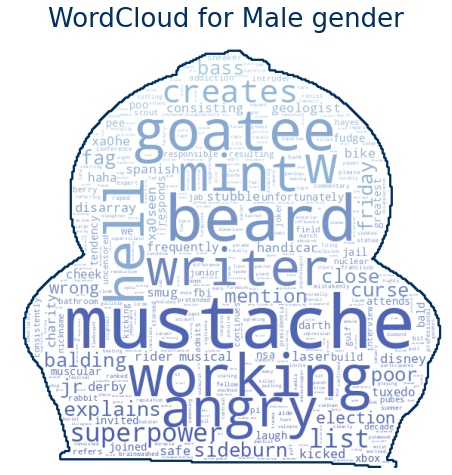

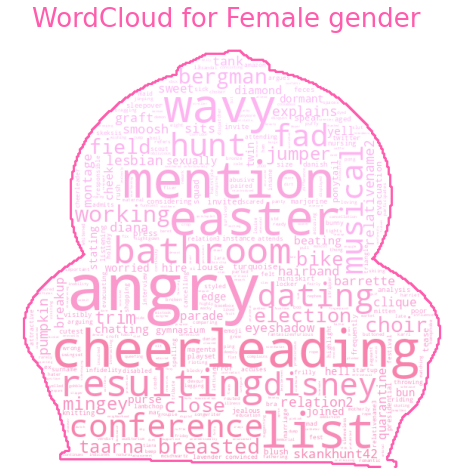

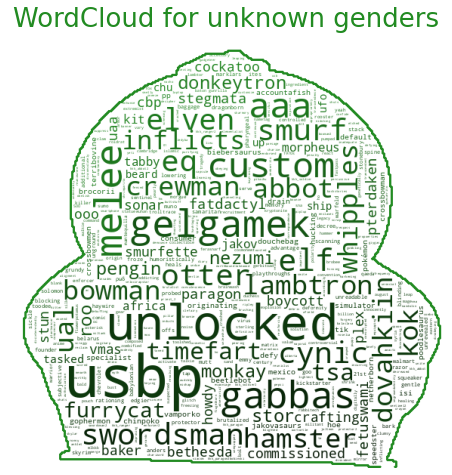

In [ ]:
# creating a mask for the word-cloud
south_park = np.array(Image.open('/work/masks/Eric-cartman.png'))

# creating array of colour gradient
blue_gradient = np.array(Image.open('/work/masks/blue_gradient.jpg'))
pink_gradient = np.array(Image.open('/work/masks/pink_gradient.png'))
green_gradient = np.array(Image.open('/work/masks/green_gradient.jpg'))

#generate the gradient
image_colors_male = ImageColorGenerator(blue_gradient)
image_colors_female = ImageColorGenerator(pink_gradient)
image_colors_unknown = ImageColorGenerator(green_gradient)

wordcloud1 = WordCloud(collocations=False, background_color= "white", color_func = image_colors_male,  max_words=2000, mask=south_park, contour_width=2, contour_color='#003060').generate_from_frequencies(male)
plt.figure(figsize=(12,8))
plt.imshow(wordcloud1)
plt.axis("off")
plt.title("WordCloud for Male gender", fontsize = 26, color ='#003060')
plt.savefig('./plot_images/male_cloud.png')

wordcloud2 = WordCloud(collocations=False, background_color= "white", color_func = image_colors_female,  max_words=2000, mask=south_park, contour_width=2, contour_color='#FF5CAD').generate_from_frequencies(female)
plt.figure(figsize=(12,8))
plt.imshow(wordcloud2)
plt.axis("off")
plt.title("WordCloud for Female gender", fontsize = 26, color ='#FF5CAD')
plt.savefig('./plot_images/female_cloud.png')

wordcloud3 = WordCloud(collocations=False, background_color= "white", color_func = image_colors_unknown, max_words=2000, mask=south_park, contour_width=2, contour_color='#228b22').generate_from_frequencies(other)
plt.figure(figsize=(12,8))
plt.imshow(wordcloud3)
plt.axis("off")
plt.title("WordCloud for unknown genders", fontsize = 26, color ='#228b22')
plt.savefig('./plot_images/unknown_cloud.png')
plt.show()

In these three wordcoulds you can see the most frequent words used by each gender from the biggest font displaying the most pronounced word to other less frequent. It is very interesting to observ what are women talking about in comparison to men. The third category encapsulates all other characters which do not have gender information. Thus, the last category is less informative but still interesting to observe. 

As we can see, men have different topics n comparison to women as seen from the word cloud. A lot of description is centered around hair in words like **mustache, beard, goatee** being some of the most used. Also, in male description we can see  **working** a lot as well as **friday** since we believe a lot of talking is about friday especially after working. There are also other words distinct to men as **hell, wrong, balding, angry, poor**. We can also observe the word **jr** which is self explanatory since South Park is about kids who are in school.

For female characters descriptions we can observe very female specific things as **cheerleading, bathroom, dating..."**. In both males and females we can see anger since there is a lot of tension in the series. Also, in both genders there is discussion about election. We can observe that they are also interested in politics. Surprisingly there is not so much talking about **shopping**.

In general, we can observe that the word clouds are a good indicator of main topics and mainstream words that describe each gender in this case. It is always interesting to analyze and discuss about the findings that show the specific features of each category. 

# 4) Communities 


For this part we will generate commnities using the Louvaine Algorithm explained below. From there we are extracting 5 biggest communities and creating wordclouds for each of them. 

### The communities are identified using the Louvaine algorithm. 

The Louvaine method is an algorithm to identify comunities in large networks. It is a greedy optimization method. The idea is to optimize the so-called **modularity** as explained in the original paper which is a scalar between -1 and 1 which is measuring how densely are links inside communities connected in comparison to links between communities. Thus, modularity quantifies how qualitative is an assignment of nodes to communities. So, Louvaine algorithm is a hierarchical clustering one that merges communities in single nodes, which is known as **Community Aggregation** and performs the modularity clustering on the condensed graphs. These steps will be repeated till no more changes in the network happen.

Referencing the [original paper](https://arxiv.org/pdf/0803.0476.pdf) [1] when we have a weighted network, modularity is defined as: 


$M=\frac{1}{2 m} \sum_{i, j}\left[A_{i j}-\frac{k_{i} k_{j}}{2 m}\right] \delta\left(c_{i}, c_{j}\right)$

Where $A_{ij}$ stands for the weight between **i** and **j** edges. $k_{i}=\sum_{j} A_{i j}$ is the degree of node **i**, $c_i$ is the communitythat node belongs to. The $\delta$-function $\delta(u, v)$ is 1 if $u=v$ and 0 otherwise and $m=\frac{1}{2} \sum_{i j} A_{i j}$. 

### **Modularity Optimization**
The algorithm will remove and insert each node one by one in another community C until the modularity is not increasing anymore. 
\begin{equation}
\Delta M=\left[\frac{\Sigma_{i n}+2 k_{i, \text { in }}}{2 m}-\left(\frac{\Sigma_{\text {tot }}+k_{i}}{2 m}\right)^{2}\right]-\left[\frac{\Sigma_{\text {in }}}{2 m}-\left(\frac{\Sigma_{\text {tot }}}{2 m}\right)^{2}-\left(\frac{k_{i}}{2 m}\right)^{2}\right]
\end{equation}

where $\Sigma_{i n}$ is the sum of all weights of the links inside C, and $\Sigma_{tot}$ the sum of the weights of all links to nodes in 𝐶, $ k_{i}$ is the sum of the weights of the links incident to node $i, k_{i, i n}$ is the sum of the weights of the links from $i$ to nodes in $C$ and $m$ is the sum of the weights of all the links in the network.

Further improving the performance the upper equation can be simplified to: 

$\Delta M=\frac{k_{i, i n}}{m}-\frac{2 \sum_{t o t} k_{i}}{(2 m)^{2}} \Leftrightarrow \Delta M m=k_{i, \text { in }}-\frac{\sum_{\text {tot }} k_{i}}{2 m}$

thus recalculating modularity when another node is considered. 

In [ ]:
# this package imports the Louvvain algorithm method:
import community.community_louvain as community_louvain

G = GN

# we compute the best partition
partition = community_louvain.best_partition(G, random_state=123)

The **partion** is the dictionary which strores the characters which have been identified with the computed partitions and their community (partition) number. 

We can add this value as an extra column to the DataFrame object containing the South Park characters and their other attributes. Then we will drop the characters which do not belong in any community: 

In [ ]:
comm_num = []
for idx, row in df_final.iterrows():
    if row.Name in partition:
        comm_num.append(partition[row.Name])
    else:
        comm_num.append("")

df_final['Community'] = comm_num        
# drop the characters which are not part of the communities
df_final = df_final.loc[df_final.Community != '']
# we find the unique communities in the df_fin Community column:
communit = df_final.Community.unique().tolist()
print('In total we have {} communities'.format(len(communit)))

In total we have 17 communities


The higher the modularity value is for a partition, the better is the corresponding community structure. 

In [ ]:
# Modularity on the partition
m = community_louvain.modularity(partition, G)
print('The value of modularity with the partition created by the algorithm is {:.2f}'.format(m))

The value of modularity with the partition created by the algorithm is 0.47


### Distribution of community sizes

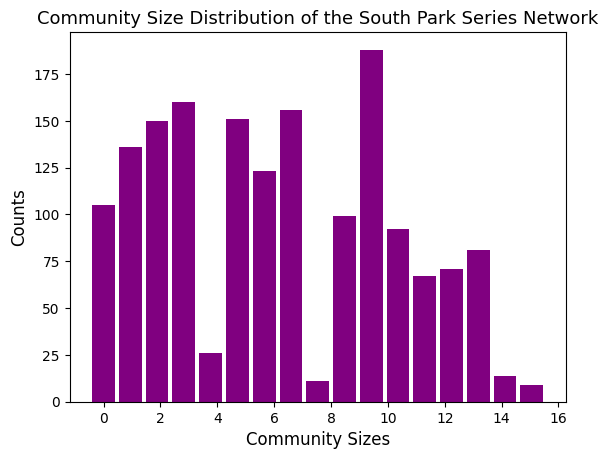

The mean size of a community is: 96


In [ ]:
mpl.rcParams.update(mpl.rcParamsDefault)
count,bins= np.histogram(list(partition.values()),bins=(len(set(partition.values()))))
plt.bar(bins[:-1], count, width=0.8, color = 'purple')
plt.title('Community Size Distribution of the South Park Series Network',fontsize=13)
plt.xlabel('Community Sizes',fontsize=12)
plt.ylabel('Counts',fontsize=12)
plt.show()

print('The mean size of a community is:',int(np.floor(np.mean((list(count))))))

We are obtaining the 5 largest communities


In [ ]:
communities_repeated = df_final.Community.tolist()

# occurence count of each community value
x = Counter(communities_repeated)
# sort by the occurence
sorted_x = dict(sorted(x.items(), key=lambda item: item[1]))
# extract the first top 5 according to the highest 5 key values:
communities_top5 = sorted(x, key=x.get, reverse=True)[:5]
print('Top 5 largest communities are the partition numbers: ', communities_top5)

Top 5 largest communities are the partition numbers:  [10, 3, 7, 5, 2]


The procedure for calculating the TF-IDF score for each word is similar to the one explained when calculating for genders. We will derive the IDF **from all the communities** and then we will report on the top 5 communities. 

We create a dictionary, community_tokens_dict, which has as keys all community values. The value of each key is a list of clear processed word tokens concatenated from each character belonging to the respective community. 

In [ ]:
# Create a dictionary: {k:v} -> {community : []}
community_tokens_dict = {k: [] for k in communit}


for name in tqdm(df_final.itertuples()): #or name_list
    # give clear tokens for each character in the community
    clear_tokens = give_clean_tokens(name.Name, namelist, file_path)
    # get the dictionary key: community value for the character
    community_of_name = df_final.loc[df_final['Name'] == name.Name, 'Community'].iloc[0]
    #extend the corresponding list of the dictionary key
    community_tokens_dict[community_of_name].extend(clear_tokens)

1639it [02:01, 13.54it/s]


In [ ]:
# remove characters names from communities 
communities_numbers = [10, 3, 7, 5, 2]
for character in namelist:
    for k, v in community_tokens_dict.items():
        if k in communities_numbers:
            community_tokens_dict[k] = [x for x in community_tokens_dict[k] if x!=character.lower()]


In [ ]:
# test 
"gibson" in community_tokens_dict[5]

False

In [ ]:
# TF: no of occurencies of word / len(text)
def tf(token_list, dict_selected):
    """
    tf computes the TF for each word in a token_list of a given corpus 

    Input:
    :token_list: (str list) list of tokens - [token1, token2 ..] -- (in this case it will originate from a key value in a dictionary)
    :dict_selected: (dict) dictionary of the form: {key : token_list}

    Return:
    :token_tf_list: (tuple list) a list with all the token_list elements plus the TF corresponding for each token - [(token, tf)]
    """ 
    import numpy as np
    import collections

    #make a dictionary for each token: {k:v} -> {token : token occuerence}
    token_freq_dict = dict(collections.Counter(token_list))

    #create sorted list token_freq_list: [(word, tf)]
    token_freq_list = [(k,v/len(token_list)) for k,v in token_freq_dict.items()]
    token_freq_list.sort(key=lambda x:x[1])

    #create a new token list which also includes the idf value: [(token, tf)]             
    token_tf_list = [(word,freq) for (word,freq) in token_freq_list]
    token_tf_list.sort(key=lambda x:x[1],reverse=True)
    return token_tf_list

We create another dictionary, **community_token_tf**, which has as keys the 17 community values. The value of each key is a list of tuples: (token, tf score).

In [ ]:
# tf for each community token

# empty dictionary community_token_tf: {k:v} -> {community no. : []}
community_token_tf = {k: [] for k in communit}

# update the values of community_token_tfidf s.t.: {k:v} -> {community no. : (token, tf)}
for k,v in tqdm(community_tokens_dict.items()):
    tokens_per_community = community_tokens_dict[k]
    tokens_freq_list = tf(tokens_per_community, community_tokens_dict)
    community_token_tf[k] = tokens_freq_list

100%|██████████| 17/17 [00:00<00:00, 96.08it/s]


Then we do the same for the tf-idf

In [ ]:
# tf-idf for each community token

# empty dictionary community_token_tfidf: {k:v} -> {community no. : []}
community_token_tfidf = {k: [] for k in communit}

# update the values of community_token_tfidf s.t.: {k:v} -> {community no. : (token, tf-idf)}
for k,v in tqdm(community_tokens_dict.items()):
    tokens_per_community = community_tokens_dict[k]
    tokens_freq_list = tf_idf(tokens_per_community, community_tokens_dict)
    community_token_tfidf[k] = tokens_freq_list

100%|██████████| 17/17 [10:18<00:00, 36.38s/it]


In [ ]:
# extracting top 5 communities with their corresponding frequency for each word
communities_tfidf_top5 = { c_key: community_token_tfidf[c_key] for c_key in communities_top5 }
communities_tf_top5 = { c_key: community_token_tf[c_key] for c_key in communities_top5 }

**Five top words for each community according to TF:**

In [ ]:
for k,v in communities_tf_top5.items():
    print('\n5 most frequent words (according to TF) for community no. ',k)
    print(communities_tf_top5[k][:5]) #since the list is already sorted by the tf score


5 most frequent words (according to TF) for community no.  10
[('he', 0.01772761168734323), ('episode', 0.015659955257270694), ('seen', 0.013558402820147787), ('also', 0.010067114093959731), ('wear', 0.007660497593383499)]

5 most frequent words (according to TF) for community no.  3
[('he', 0.029185638575800553), ('seen', 0.026871687691274165), ('episode', 0.021273419422258716), ('wear', 0.014032992460998732), ('appears', 0.012017615884153168)]

5 most frequent words (according to TF) for community no.  7
[('seen', 0.0552670404249041), ('she', 0.01336677485984066), ('butter', 0.013219238713484804), ('he', 0.013012688108586603), ('episode', 0.011153732664502803)]

5 most frequent words (according to TF) for community no.  5
[('he', 0.02823046323623765), ('episode', 0.01430771204927499), ('seen', 0.012126267162838445), ('appears', 0.009944822276401899), ('wear', 0.009046580264339792)]

5 most frequent words (according to TF) for community no.  2
[('seen', 0.02907265679355929), ('he', 0

**FIve top words for each community according to TF-IDF:**

In [ ]:
for k,v in communities_tfidf_top5.items():
    print('\n5 most frequent words (according to TF-IDF) for community no. ',k)
    print(communities_tfidf_top5[k][:5]) #since the list is already sorted by the tf-idf score


5 most frequent words (according to TF-IDF) for community no.  10
[('stuffed', 0.002393810026282182), ('camper', 0.002176190932983802), ('usbp', 0.0020167270091919374), ('bronco', 0.0014518385230416259), ('mmm', 0.0011524154338239643)]

5 most frequent words (according to TF-IDF) for community no.  3
[('mart', 0.0019129835993727646), ('nsa', 0.0016831987549485246), ('o', 0.0014066055877740916), ('remedy', 0.0012688870690704857), ('wei', 0.0012688870690704857)]

5 most frequent words (according to TF-IDF) for community no.  7
[('hallway', 0.003481003166446625), ('cafeteria', 0.0017854591886940256), ('assembly', 0.0014564937602071703), ('lunch', 0.0012010410466237766), ('clique', 0.0010103587670681714)]

5 most frequent words (according to TF-IDF) for community no.  5
[('critter', 0.0024715251471149027), ('rabbit', 0.00200459490856184), ('millennium', 0.0016476834314099352), ('lunchbox', 0.0016360143780640283), ('closet', 0.0014700362662786826)]

5 most frequent words (according to TF-I

**Explanation**

When it comes to the top 5 fors for each community according to the TF, it seems that more of the general-vocabulary language words are found. Those are either pronouns ('he', 'she', 'mr'), connecting words ('also') or verbs describing simple actions ('wear', 'seen'...). This is expected, as those words are usually common for the english language and may appear quite often in the text. This is the reason why using only the term-frequency score for a word might not be enough to find the top 5 representative words for each community. 

When including the IDF score as well, each word is gets a score proportional to its frequency in a text document but offset by the number of documents which contain the word. Therefore, commonly used words will have less impact if they are genrally used within the language. By considering this fact one can say that the top 5 words for each community according to the TF-IDF score are more descriptive than the ones found when only the TF score was considered. 

### Creating wordclouds for each community

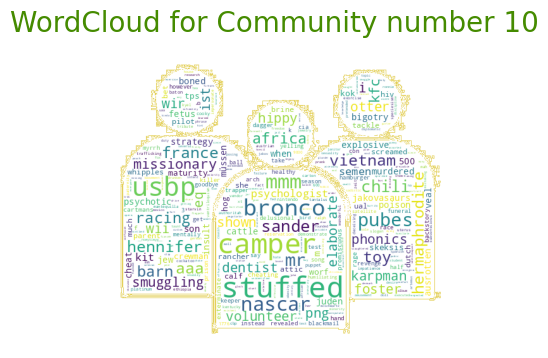

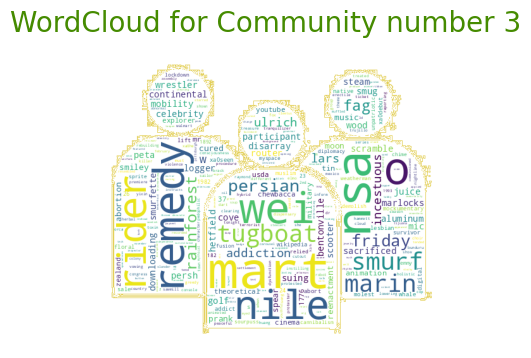

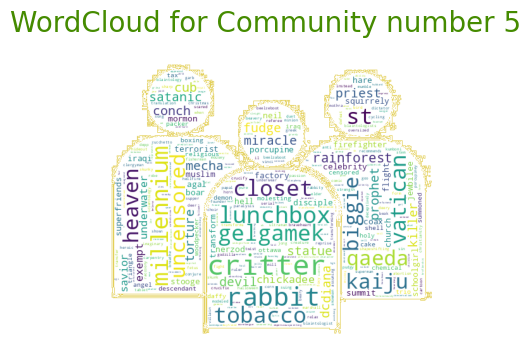

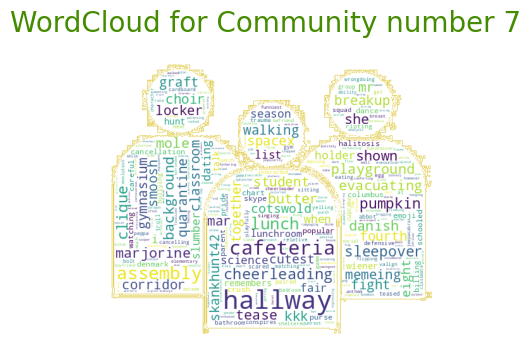

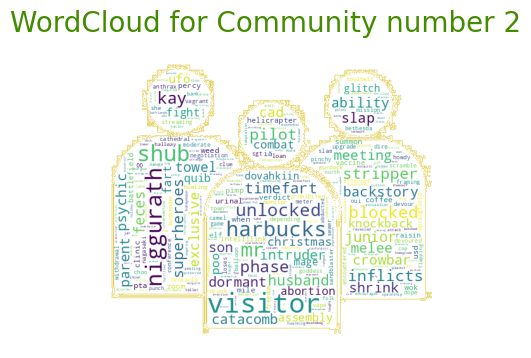

In [ ]:
# creating a mask for the word-cloud
community_mask = np.array(Image.open('/work/masks/community1.jpg'))
ten = dict(communities_tfidf_top5[10])
wordcloud1 = WordCloud(collocations=False, background_color= "white",  max_words=2000, mask=community_mask, contour_width=0.5, contour_color='#E3CF57').generate_from_frequencies(ten)
plt.figure(figsize=(6,4))
plt.imshow(wordcloud1)
plt.axis("off")
plt.title("WordCloud for Community number 10", fontsize = 20, color ='#458B00')
plt.savefig('./plot_images/comm10.png')

three = dict(communities_tfidf_top5[3])
wordcloud1 = WordCloud(collocations=False, background_color= "white",  max_words=2000, mask=community_mask, contour_width=0.5, contour_color='#E3CF57').generate_from_frequencies(three)
plt.figure(figsize=(6,4))
plt.imshow(wordcloud1)
plt.axis("off")
plt.title("WordCloud for Community number 3", fontsize = 20, color ='#458B00')
plt.savefig('./plot_images/comm3.png')

five = dict(communities_tfidf_top5[5])
wordcloud1 = WordCloud(collocations=False, background_color= "white",  max_words=2000, mask=community_mask, contour_width=0.5, contour_color='#E3CF57').generate_from_frequencies(five)
plt.figure(figsize=(6,4))
plt.imshow(wordcloud1)
plt.axis("off")
plt.title("WordCloud for Community number 5", fontsize = 20, color ='#458B00')
plt.savefig('./plot_images/comm5.png')

seven = dict(communities_tfidf_top5[7])
wordcloud1 = WordCloud(collocations=False, background_color= "white",  max_words=2000, mask=community_mask, contour_width=0.5, contour_color='#E3CF57').generate_from_frequencies(seven)
plt.figure(figsize=(6,4))
plt.imshow(wordcloud1)
plt.axis("off")
plt.title("WordCloud for Community number 7", fontsize = 20, color ='#458B00')
plt.savefig('./plot_images/comm7.png')

two = dict(communities_tfidf_top5[2])
wordcloud1 = WordCloud(collocations=False, background_color= "white",  max_words=2000, mask=community_mask, contour_width=0.5, contour_color='#E3CF57').generate_from_frequencies(two)
plt.figure(figsize=(6,4))
plt.imshow(wordcloud1)
plt.axis("off")
plt.title("WordCloud for Community number 2", fontsize = 20, color ='#458B00')
plt.savefig('./plot_images/comm2.png')
plt.show()

**Comments**

Above, we can see a wordcloud for each of the top five identified communities. From the images we can conclude that each community has certainly different predominant words meaning that the algorithm worked well. Taking a look into each word cloud separately we cannot see from the start any correlation between words. However, in **Community nr 7** we can probably deduct the main topic being in school as we can see words like **hallway, cafeteria, lunch, classroom...**

Rest of the words in toher communities come from the characters who are more linked to each other. However, they might not have as many things in common and the words are not as informative. Also, one would need to have a lot pf prior knowledge about the characters and South Park in general to better understand and draw insights from it. 

# 5) WordCould for Eric Cartman Lines in Southpark 

Since Eric Cartman is the main character in SP, we have decided to create a wordcloud displaying the most often said words by Cartman. Also we will chose Wendy Testaburger because she is the main female character. So to say, we want to have some gender equality in here.

Note: The code for web scraping was borrowed from this [Kaggle](https://www.kaggle.com/mustafacicek/south-park-scripts-dataset?select=SouthPark_Lines.csv) page.  

In [ ]:
url = "https://southpark.fandom.com/wiki/List_of_Episodes"

In [ ]:
def get_descriptions(df):
    
    temp = df.iloc[::2, :]    
    descriptions = df.iloc[1::2, :]
    temp.loc[:, "Description"] = descriptions["Title"].tolist()    
    temp.drop("Screenshot", axis = 1, inplace = True)
    temp = temp[~temp["Description"].str.contains("This episode has not yet been released.")]
    temp["Season"] = round((temp["Code"]).astype(int) / 100).astype(int)
    temp["Episode"] = temp["Code"].astype(int) % 100
    temp["Title"] = temp["Title"].str.replace('"', "")
    
    return temp

In [ ]:
d = {}
tx = get(url)
df_list = pd.read_html(tx.text, header = 0)

for i in range(4, 28):
    
    df = df_list[i]
    df = df[:-1]
    
    try:
        d[i] = get_descriptions(df)
    except:
        print(i)

/shared-libs/python3.7/py/lib/python3.7/site-packages/pandas/core/indexing.py:1597: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/shared-libs/python3.7/py/lib/python3.7/site-packages/pandas/core/indexing.py:1676: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/shared-libs/python3.7/py/lib/python3.7/site-packages/pandas/core/frame.py:4315: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/st

In [ ]:
episodes = pd.concat(d, ignore_index = True)

In [ ]:
def get_lines(episode_name):
    
    episode_name = episode_name.replace("#", "")
    episode_name = episode_name.replace("?", "%3F")
    episode_name = episode_name.replace("'", "%27")
    episode_name = episode_name.replace("!!!", "")
    episode_name = episode_name.replace("Imaginationland Episode I", "Imaginationland")
    url = "https://southpark.fandom.com/wiki/" + episode_name.replace(" ", "_") + "/Script"
    
    episode = get(url)
    df_list = pd.read_html(episode.text)
    columns = ["Character", "Line"]
    df = df_list[1]
    
    df = df.iloc[:, :2]
    df.columns = columns
    df["Title"] = df["Character"][0]   
    df.dropna(axis = 0, how = "all", subset = ["Character", "Line"],  inplace = True)
    df["Character"].fillna("Scene Description", inplace = True)
    df = df[["Title", "Character", "Line"]]
    df = df[1:-1]
    df.reset_index(drop = True, inplace = True)
    
    return df

In [ ]:
lines = {}

for i in range(0, episodes.shape[0]):
    
    try:
        lines[i] = get_lines(episodes["Title"][i])
    except:
        print(episodes["Title"][i])

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/shared-libs/python3.7/py/lib/python3.7/site-packages/pandas/core/series.py:4469: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/shared-libs/python3.7/py-core/lib/python3.7/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/shared-libs/python3.7/py-core/lib/python3.7/site-packages/ipykernel_launcher.py:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a Dat

In [ ]:
lines_df = pd.concat(lines, ignore_index = True)


In [ ]:
# replace to match the name
lines_df["Character"] = lines_df["Character"].replace({"Eric Cartman": "Cartman",
                                                        "Wendy Testaburger": "Wendy"})

In [ ]:
cartman_lines = lines_df.loc[lines_df["Character"] == "Cartman"]

In [ ]:
wendy_lines = lines_df.loc[lines_df["Character"] == "Wendy"]

In [ ]:
lines_list = list(cartman_lines.Line)
# remove text in square brackets
pat1 = r'\[(.*?)\]'
# remove puctuation 
pat2 = r"[^\w\d'\s]+"
# remove digits 
pat3 = r'\d+'
# remove more than one empty space
pat4 = r' +'


lines_list = ','.join(map(str, lines_list))
lines_list = re.sub(pat1, ' ', str(lines_list))
lines_list = re.sub(pat2, ' ', str(lines_list))
lines_list = re.sub(pat3, ' ', str(lines_list))
lines_list = re.sub(pat4, ' ', str(lines_list))
#remove stop words
text_tokens = word_tokenize(lines_list)

data_without_sw = [word for word in text_tokens if not word in stopwords.words('english')]
#lowercase each letter
data_lowercase = list(map(str.lower, data_without_sw)) 

#lemmatize each word
lemmatizer = WordNetLemmatizer()
data_lemmatized = [lemmatizer.lemmatize(word) for word in data_lowercase]
#lines_list = list(lines_list.split(" "))

In [ ]:
# implement tf-idf for cartman
vectorizer = TfidfVectorizer(min_df = .0005, max_df = 0.7)
vecs = vectorizer.fit_transform(data_lemmatized)
feature_names = vectorizer.get_feature_names_out()
dense = vecs.todense()
lst1 = dense.tolist()
# save to a dataframe
df = pd.DataFrame(lst1, columns=feature_names)
w_frequencies_c = df.T.sum(axis=1)

In [ ]:
lines_list = list(wendy_lines.Line)
# remove text in square brackets
pat1 = r'\[(.*?)\]'
# remove puctuation 
pat2 = r"[^\w\d'\s]+"
# remove digits 
pat3 = r'\d+'
# remove more than one empty space
pat4 = r' +'


lines_list = ','.join(map(str, lines_list))
lines_list = re.sub(pat1, ' ', str(lines_list))
lines_list = re.sub(pat2, ' ', str(lines_list))
lines_list = re.sub(pat3, ' ', str(lines_list))
lines_list = re.sub(pat4, ' ', str(lines_list))
#remove stop words
text_tokens = word_tokenize(lines_list)

data_without_sw = [word for word in text_tokens if not word in stopwords.words('english')]
#lowercase each letter
data_lowercase = list(map(str.lower, data_without_sw)) 

#lemmatize each word
lemmatizer = WordNetLemmatizer()
data_lemmatized = [lemmatizer.lemmatize(word) for word in data_lowercase]
#lines_list = list(lines_list.split(" "))

In [ ]:
# implement tf-idf for wendy
vectorizer = TfidfVectorizer(min_df = .0002, max_df = 0.7)
vecs = vectorizer.fit_transform(data_lemmatized)
feature_names = vectorizer.get_feature_names_out()
dense = vecs.todense()
lst1 = dense.tolist()
# save to a dataframe
df = pd.DataFrame(lst1, columns=feature_names)
w_frequencies_w = df.T.sum(axis=1)

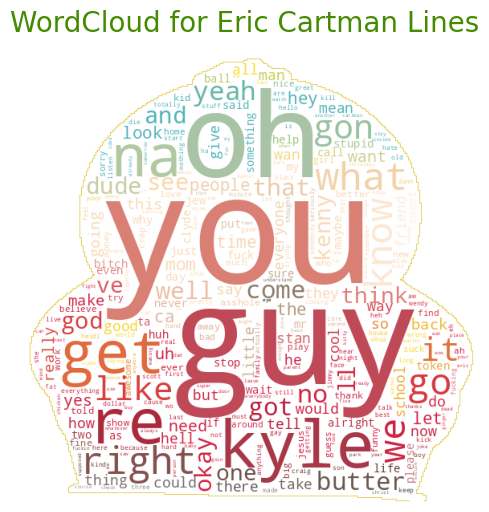

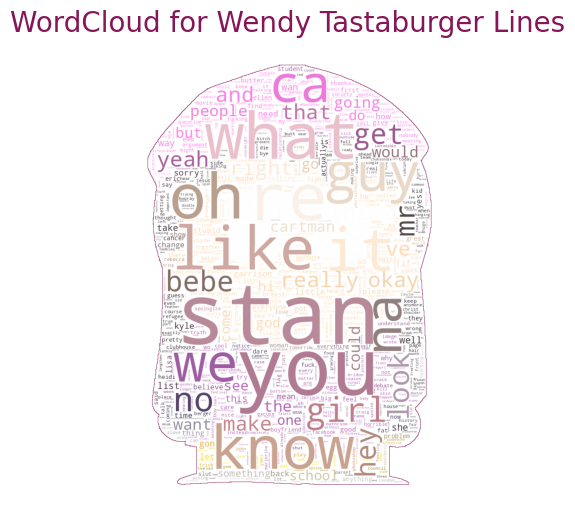

In [ ]:
#generate wordclouds
cartman_mask = np.array(Image.open('/work/masks/Eric-cartman.png'))
wendy_mask = np.array(Image.open('/work/masks/Wendy.png'))
image_colors_cartman = ImageColorGenerator(cartman_mask)
image_colors_wendy = ImageColorGenerator(wendy_mask)

wordcloud_c = WordCloud(collocations=False, color_func = image_colors_cartman,background_color= "white",  max_words=2000, mask=cartman_mask, contour_width=0.5, contour_color='#E3CF57').generate_from_frequencies(w_frequencies_c)
plt.figure(figsize=(8,6))
plt.imshow(wordcloud_c)
plt.axis("off")
plt.title("WordCloud for Eric Cartman Lines", fontsize = 20, color ='#458B00')
plt.savefig('./plot_images/eric_wc.png')

wordcloud_w = WordCloud(collocations=False, color_func = image_colors_wendy, background_color= "white",  max_words=2000, mask=wendy_mask, contour_width=0.5, contour_color='#861657').generate_from_frequencies(w_frequencies_w)
plt.figure(figsize=(8,6))
plt.imshow(wordcloud_w)
plt.axis("off")
plt.title("WordCloud for Wendy Tastaburger Lines", fontsize = 20, color ='#861657')
plt.savefig('./plot_images/wendy_wc.png')

plt.show()

Interesting findings. Here we can see the most frequent words said by both characters. We can observe that the characters are using a lot of short words and mostly to express a sentiment at the moment like **oh, yeah, okay, right, na**. We all know that Wendy is in love with Stan Marsh and this can be also seen in the wordcloud as she is pronouncing his name the most. 

# 6) Sentiment Analysis

We attempted to complete a sentiment analysis of all the characters, however this unfortunately did not yield any useful results due to the type of available data. 

The Wiki did not have any quotes from the characters and thus, it was only possible to do a sentiment analysis of the neutral text about the characters, rather than on the characters themselves. 

In [ ]:
#The LabMT list is loaded from github and a pandas dataframe is created. 
LabMT_list_URL = "https://raw.githubusercontent.com/AI-LearningAndOptimize/detect-mental-health-issues-from-twitter/master/labMIT-1.0.txt"
LabMT_df = pd.read_csv(LabMT_list_URL, sep="\t", header=2, usecols=[0,2,3],  skip_blank_lines=True, names = ["word", "happiness_average", "happiness_standard_deviation"])

In [ ]:
#We were interested in seeing, if the results make sense and thus selected the following characters: 
file_path = '/work/Characters_txt_files/'
characters = ["Eric_Cartman", "Kenny_McCormick", "Kyle_Broflovski", "Stan_Marsh", "Butters_Stotch", "Randy_Marsh", "Herbert_Garrison"]

In [ ]:
import collections
final_list = []
for character in characters:
    #The words are "normalised", via the function from before
    clear_tokens = give_clean_tokens(character, [character], file_path)
    tokenList = [token for token in clear_tokens if token in list(LabMT_df["word"])]

    countsDict = collections.Counter(tokenList);
    uTokens = set(tokenList)
    amean_tokenList = 0
    sum_probs = 0

    for token in uTokens:
        amean_token = LabMT_df["happiness_average"][LabMT_df["word"] == token].item()
        p_token = countsDict[token] / len(tokenList)
        amean_tokenList += amean_token * p_token
        sum_probs += p_token
    amean_tokenList = amean_tokenList - 5
    final_list.append(amean_tokenList)

print(final_list)

[0.5161515601782982, 0.59259723964868, 0.5233821871476891, 0.5243432343234247, 0.5760747663551449, 0.676944270507204, 0.5491839378238321]


In [ ]:
#To ensure that the results were strange, 
characters = ["Shelly_Marsh", "Tweek_Tweak", "Sheila_Broflovski", "Mr._Mackey", "Sharon_Marsh", "Liane_Cartman", "Jimmy_Valmer"]

In [ ]:
import collections
final_list = []
for character in characters:
    #The words are "normalised", via the function from before
    clear_tokens = give_clean_tokens(character, [character], file_path)
    tokenList = [token for token in clear_tokens if token in list(LabMT_df["word"])]

    countsDict = collections.Counter(tokenList);
    uTokens = set(tokenList)
    amean_tokenList = 0
    sum_probs = 0

    for token in uTokens:
        amean_token = LabMT_df["happiness_average"][LabMT_df["word"] == token].item()
        p_token = countsDict[token] / len(tokenList)
        amean_tokenList += amean_token * p_token
        sum_probs += p_token
    amean_tokenList = amean_tokenList - 5
    final_list.append(amean_tokenList)

print(final_list)

[0.5161515601782982, 0.59259723964868, 0.5233821871476891, 0.5243432343234247, 0.5760747663551449, 0.676944270507204, 0.5491839378238321]


While we wanted to do a sentiment analysis, much like with the Zelda project, we unfortunately did not have any appropriate data. Wiki pages tend to be written in very neutral language, which means that while methodologies like the LabMT do work, they do produce strange results. Essentially, instead of analysing and finding the sentiment of each character, one could only find the sentiment of the character’s Wiki page itself. As will be shown by the examples below, the associated sentiment does not match with the actual character’s personality. 

Sometimes, one could have been lucky enough to find some trivia or quotes on some Wikis, but unfortunately this was not the case. If this was true for our Wiki, it would have been possible to extract only the quotes, like we did with the attributes, and analyse those.  

We even tried to get data from sources like this: https://github.com/deankeinan/SouthPark-rnn/blob/master/samples/sample-big.txt , which is someone's project where they fed a neural network 19 seasons of South Park. Unfortunately, when looking at the samples of the text, a lot of the created sentences did not make sense and thus would have probably provided an even worse base for the sentiment analysis. Especially because these quotes are not real, but generated. 

We still analysed sentiment of 14 major characters, including the main characters. The variations are visible when looking at a character like Kenny. In the show, Kenny is a very happy character, and mostly positive, however, he does die a LOT. This means that his character’s Wiki page has the most negative sentiment, out the tested characters. Kenny scored 0.324. 

Whereas, when looking at a person like Liane Cartman, Cartman’s mother, one would expect her sentiment to be negative, because she has quite a tough life in the show. However, she scored the happiest on the sentiment rating, at 0.677. 

Furthermore, 8 out of the characters had scores of 0.5, excluding Kenny and Liane, that is 2/3, which is strange when examining the characters themselves. Among these were Jimmy Valmer, Mr Mackey, Shelly Marsh, and Kyle. All of these characters have an extremely different outlook on life, and thus it did not make much sense to analyse all of the 1870 characters, especially because this would take around 3 hours to run. 


<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=20df22e1-bd6b-4c24-9922-b8282aa7b6df' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>